In [ ]:
#Install ultralytics
!pip install ultralytics --no-deps

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 22.5 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import os
import cv2
import shutil
import glob
from pathlib import Path
import random
from sklearn.model_selection import train_test_split
from ultralytics import YOLO
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
simuletic_cctv_weapon_dataset_path = kagglehub.dataset_download('simuletic/cctv-weapon-dataset')

print('Data source import complete.')


100%|██████████| 200M/200M [00:01<00:00, 133MB/s]

Extracting files...


Data source import complete.


# sample train image shows

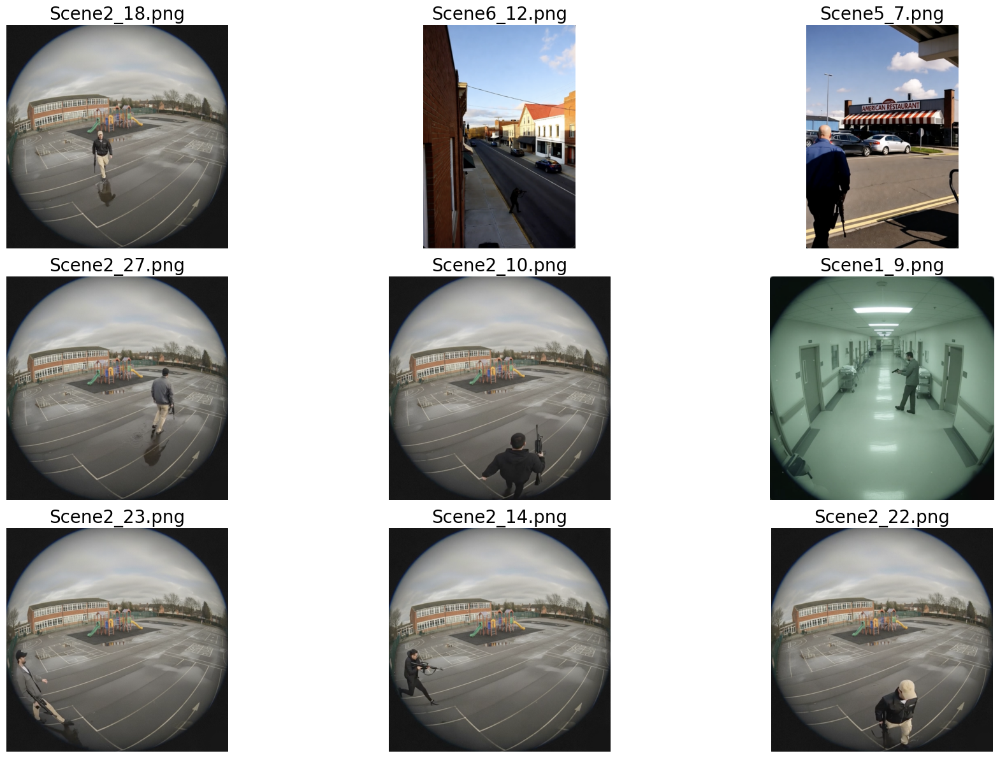

In [ ]:
train_images_dir = Path(simuletic_cctv_weapon_dataset_path) / "Dataset" / "images"
#train_images_dir = Path("/kaggle/working/sample_dataset_for_streamlit")

image_files = list(train_images_dir.glob("*.png"))

sample_files = random.sample(image_files, min(9, len(image_files)))

fig, axes = plt.subplots(3, 3, figsize=(20, 12))
axes = axes.flatten()

for ax, img_path in zip(axes, sample_files):
    img = cv2.imread(str(img_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ax.imshow(img)
    ax.axis("off")
    ax.set_title(img_path.name, fontsize=20)

plt.tight_layout()
plt.show()

In [ ]:
PATH_DATA = simuletic_cctv_weapon_dataset_path
PATH_DATASET = Path(PATH_DATA) / "Dataset"

image_files = glob.glob(str(PATH_DATASET / 'images/**/*.png'), recursive=True)
label_files = glob.glob(str(PATH_DATASET / 'labels/**/*.txt'), recursive=True)

# Create a list of tuples (image_path, label_path)
image_annotation_pairs = []
for img_path in image_files:
    # Construct the corresponding label file path by replacing 'images' with 'labels' and changing the extension to '.txt'
    label_path = Path(str(img_path).replace('images', 'labels')).with_suffix('.txt')
    if label_path.exists():
        image_annotation_pairs.append((img_path, str(label_path)))

print(f"Found {len(image_annotation_pairs)} image and annotation pairs.")

# Print the first few pairs as examples
print("\nSample image and annotation pairs:")
for img_path, label_path in image_annotation_pairs[:5]:
    print(f"Image: {img_path}, Annotation: {label_path}")

Found 0 image and annotation pairs.

Sample image and annotation pairs:


In [ ]:
# List to store the parsed data
parsed_data = []

for img_path, label_path in image_annotation_pairs:
    # Read the image
    image = cv2.imread(img_path)
    if image is None:
        print(f"Warning: Could not read image {img_path}")
        continue

    height, width, _ = image.shape

    # Read the annotation file
    annotations = []
    with open(label_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) == 5:
                class_id = int(parts[0])
                # YOLO format: center_x, center_y, width, height (normalized)
                center_x, center_y, bbox_width_norm, bbox_height_norm = map(float, parts[1:])

                # Convert normalized coordinates to absolute pixel coordinates (top-left x, top-left y, width, height)
                bbox_width_abs = bbox_width_norm * width
                bbox_height_abs = bbox_height_norm * height
                top_left_x = (center_x * width) - (bbox_width_abs / 2)
                top_left_y = (center_y * height) - (bbox_height_abs / 2)

                annotations.append({
                    'class_id': class_id,
                    'bbox': (int(top_left_x), int(top_left_y), int(bbox_width_abs), int(bbox_height_abs))
                })
            else:
                print(f"Warning: Skipping invalid line in {label_path}: {line.strip()}")

    parsed_data.append({
        'image': image,
        'annotations': annotations,
        'image_path': img_path
    })

print(f"Successfully parsed annotations for {len(parsed_data)} images.")

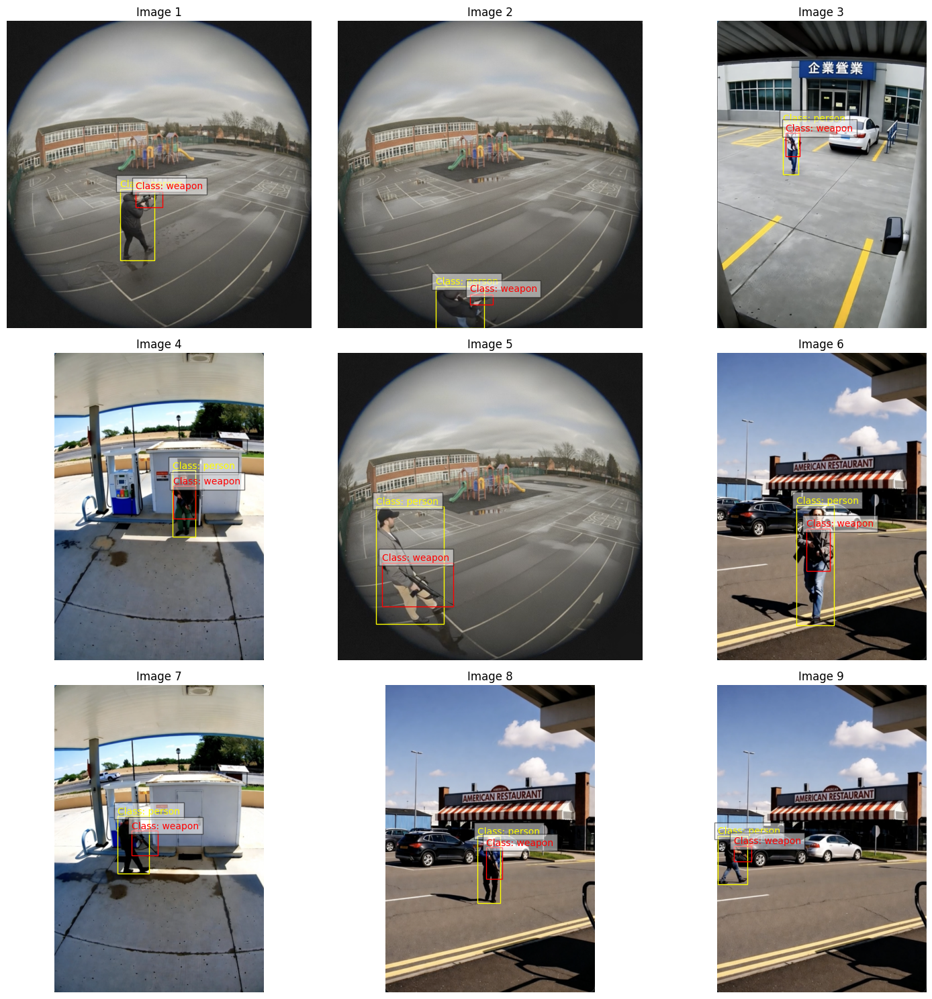

In [ ]:
class_colors = {
    0: 'yellow',
    1: 'red'
}

class_names = ['person', 'weapon']

import matplotlib.patches as patches

# Define the number of images to display and the grid layout
n_images_to_display = 9  # Display the first 9 images
n_cols = 3
n_rows = (n_images_to_display + n_cols - 1) // n_cols # Calculate rows needed
# Create a figure and a set of subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 5))
# Flatten the axes array for easy iteration
axes = axes.flatten()

# Iterate through the first n_images_to_display items in the parsed_data list
for i in range(min(n_images_to_display, len(parsed_data))):
    data = parsed_data[i]
    image = data['image']
    annotations = data['annotations']

    # Convert the image from BGR to RGB for displaying with matplotlib
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Display the image
    axes[i].imshow(image_rgb)
    axes[i].set_title(f"Image {i+1}")
    axes[i].axis('off')

    # Draw bounding boxes and labels
    for annotation in annotations:
        class_id = annotation['class_id']
        x, y, w, h = annotation['bbox']
        # Get the color for the current class, default to a color if not in class_colors
        color = class_colors.get(class_id, 'blue') # Use blue for other classes
        # Create a Rectangle patch
        rect = patches.Rectangle((x, y), w, h, linewidth=1, edgecolor=color, facecolor='none')
        # Add the patch to the Axes
        axes[i].add_patch(rect)
        # Add class ID as text
        axes[i].text(x, y - 10, f'Class: {class_names[class_id]}', color=color, fontsize=10, bbox=dict(facecolor='white', alpha=0.5))

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

In [ ]:
import yaml
PATH_DATASET = "/kaggle/input/cctv-weapon-dataset/Dataset"


# Create a Python dictionary containing the dataset information.
dataset_info = {
    'path': str(PATH_DATASET), # Base path to the dataset directory
    'train': 'images',       # Relative path from 'path' to the training images
    'val': 'images',         # Relative path from 'path' to the validation images
    'nc': len(class_names),  # Number of classes
    'names': class_names     # List of class names
}

# Define the filename for the YAML file
yaml_filename = 'dataset.yaml'

# Open the specified filename in write mode ('w') and Use a YAML library to dump the dictionary
with open(yaml_filename, 'w') as f:
    yaml.dump(dataset_info, f, default_flow_style=None)

# Print a confirmation message
print(f"Dataset YAML file '{yaml_filename}' created successfully.")

# YOLO11s model train

In [ ]:
# train.py
import os
from ultralytics import YOLO
model = YOLO('yolo11s.pt')


model.train(
        data="/kaggle/working/dataset.yaml",
        epochs=100,
        imgsz=640,
        batch=32,
        optimizer='auto',
        lr0=0.01,
        lrf=0.01,
        weight_decay=3e-3,
        warmup_epochs=5,
        patience=50,
        exist_ok=True,
        augment=True,
        workers=8,
        device=0,
        verbose=False,
        momentum= 0.837,
        cos_lr= True,

        box= 7.5,
        cls= 0.5,
        dfl= 1.5,

        hsv_h= 0.015,
        hsv_s= 0.5,
        hsv_v= 0.5,
        degrees= 0.0,
        translate= 0.08,
        scale= 0.4,
        shear= 0.0,
        perspective= 0.0,
        flipud= 0.0,
        fliplr= 0.5,
        mosaic= 1.0,
        mixup= 0.05,
        copy_paste= 0.0,
        )

print("Training complete. Best model saved.")

In [ ]:
model.val

In [ ]:
# Save the trained model
model.save('yolov8_trained.pt')
print("Model trained and saved successfully!")

In [ ]:
post_training_files_path ='/kaggle/working/runs/detect/train'

# List the files in the directory
!ls {post_training_files_path}

args.yaml   results.csv       train_batch1.jpg	weights
labels.jpg  train_batch0.jpg  train_batch2.jpg


# After detect weapon

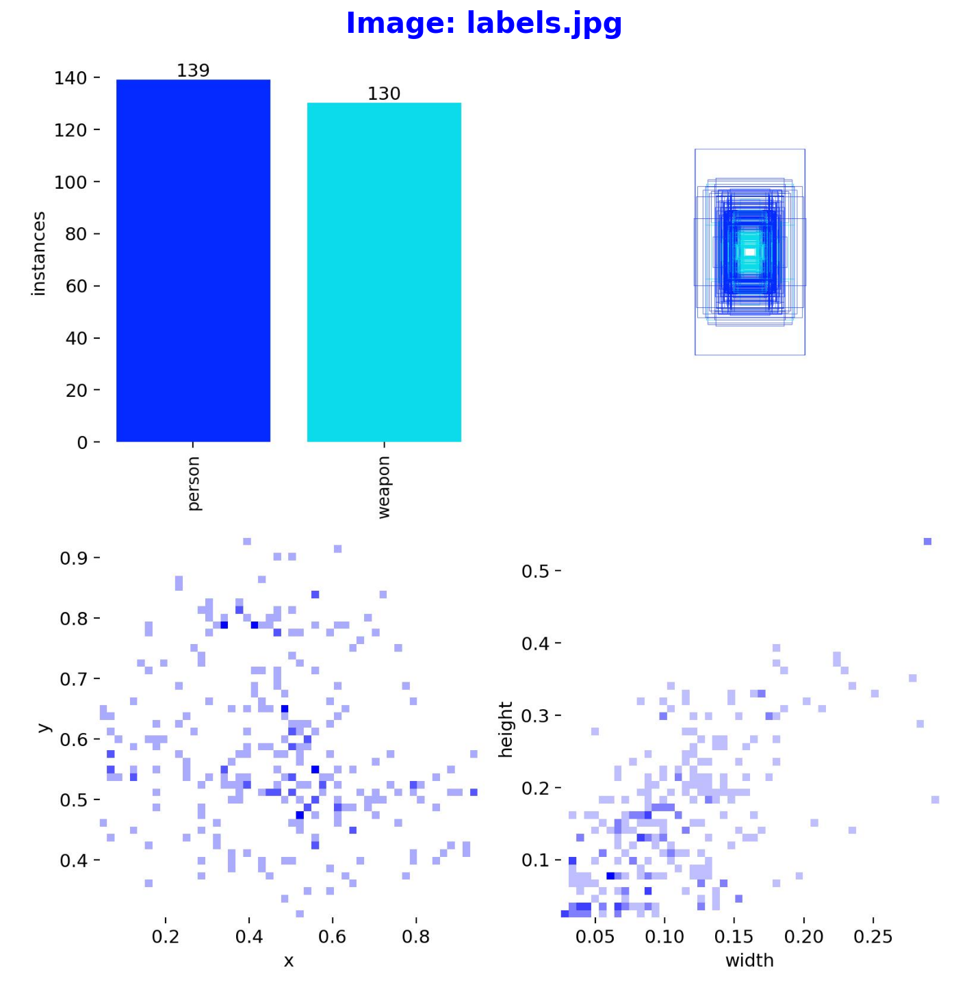

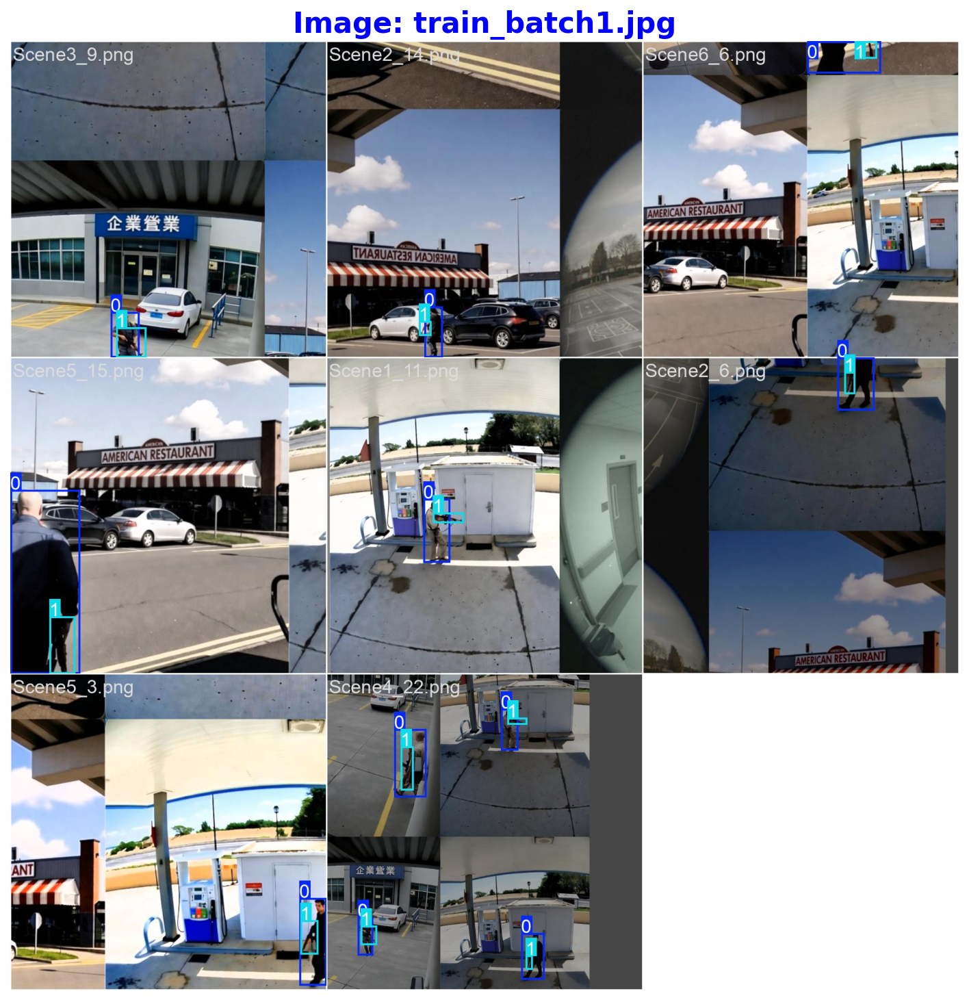

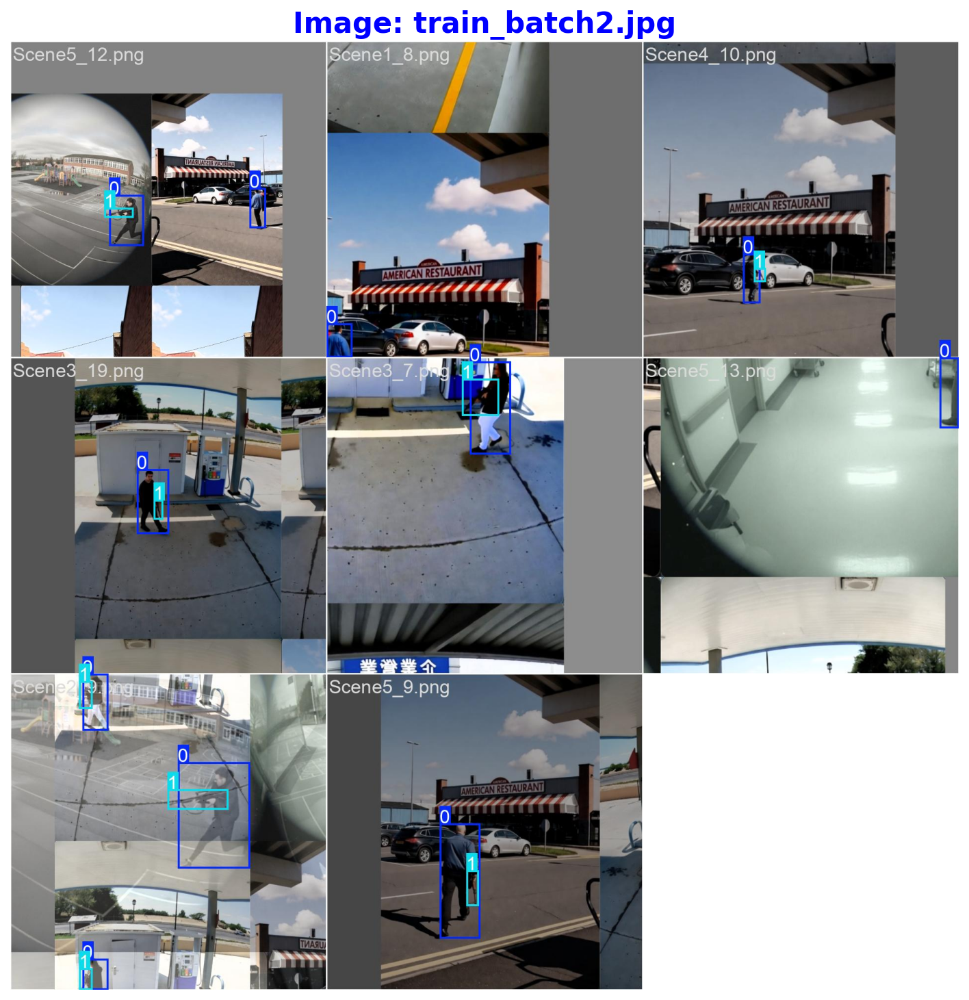

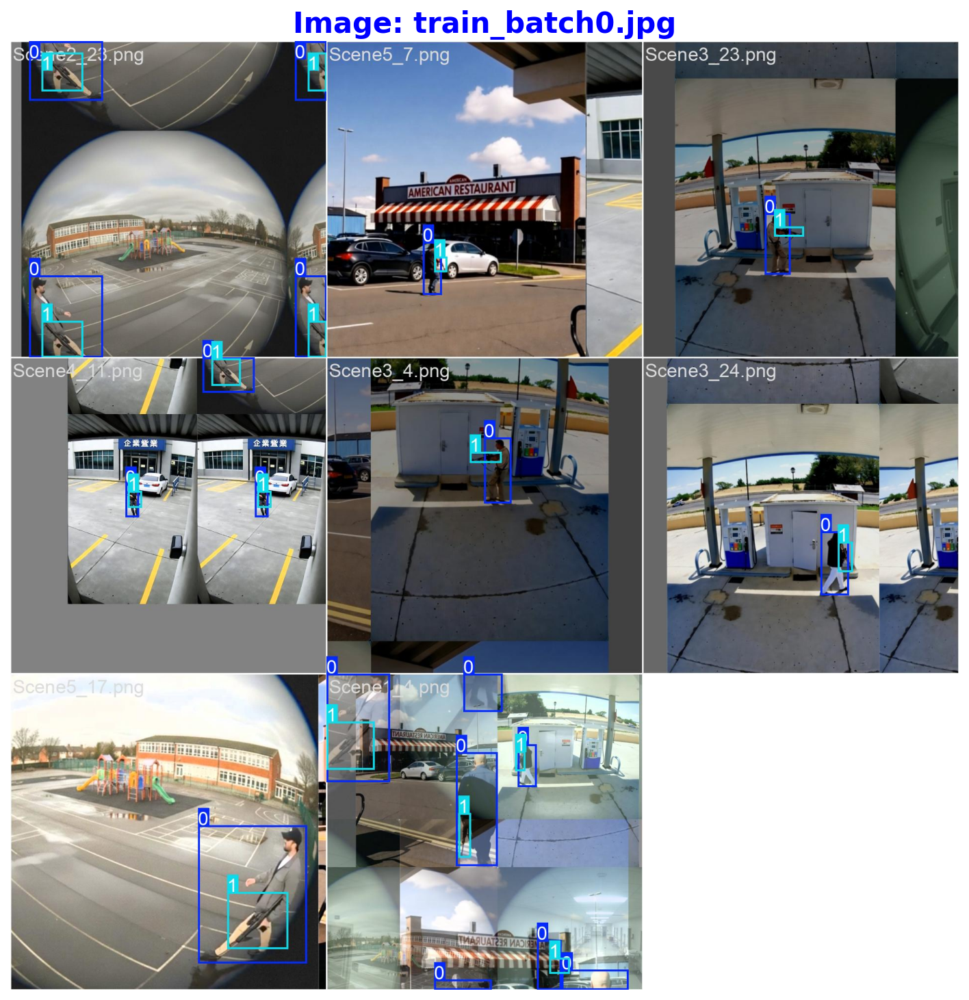

In [ ]:
from PIL import Image

# Define the path to the directory containing the images
#image_directory = "/kaggle/working/runs/detect/train2"
image_directory ='/kaggle/working/runs/detect/train'

# Iterate through all image files in the directory
for filename in os.listdir(image_directory):
    if filename.lower().endswith((".jpg",".png")):
        image_path = os.path.join(image_directory, filename)
        image = Image.open(image_path)

        # Display the image
        plt.figure(figsize=(12, 12), dpi=150)
        plt.imshow(image)
        plt.title(f"Image: {filename}", fontsize=20, fontweight='bold', color='blue')  # Customize font properties
        plt.axis("off")  # Hide axes
        plt.show()

In [ ]:
Result_Final_model = pd.read_csv('/kaggle/working/runs/detect/train/results.csv')
Result_Final_model.tail(10)

# After trained Metrics and Loss

In [ ]:
# Read the results.csv file as a pandas dataframe,
Result_Final_model.columns = Result_Final_model.columns.str.strip()

# Create subplots
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))

# Plot the columns using seaborn
sns.lineplot(x='epoch', y='train/box_loss', data=Result_Final_model, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=Result_Final_model, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=Result_Final_model, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=Result_Final_model, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=Result_Final_model, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=Result_Final_model, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=Result_Final_model, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=Result_Final_model, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=Result_Final_model, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=Result_Final_model, ax=axs[4,1])

# Set titles and axis labels for each subplot
axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')


plt.suptitle('Training Metrics and Loss', fontsize=24)
plt.subplots_adjust(top=0.8)
plt.tight_layout()
plt.show()

Using 5 random images for prediction.

Predicting on sample image 1: Scene6_4.png

image 1/1 /root/.cache/kagglehub/datasets/simuletic/cctv-weapon-dataset/versions/4/Dataset/images/Scene6_4.png: 640x448 1 person, 1 weapon, 230.3ms
Speed: 2.6ms preprocess, 230.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 448)
Results saved to /content/runs/detect/predict


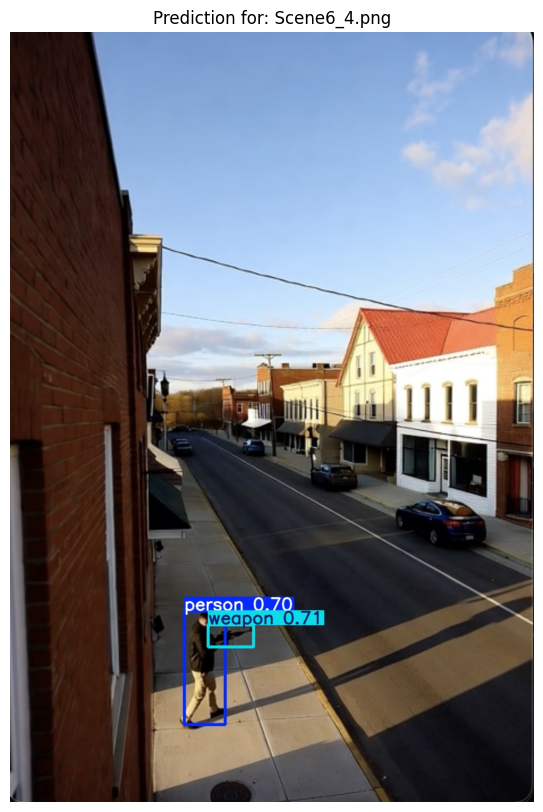


Predicting on sample image 2: Scene4_10.png

image 1/1 /root/.cache/kagglehub/datasets/simuletic/cctv-weapon-dataset/versions/4/Dataset/images/Scene4_10.png: 640x448 (no detections), 238.9ms
Speed: 4.1ms preprocess, 238.9ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 448)
Results saved to /content/runs/detect/predict


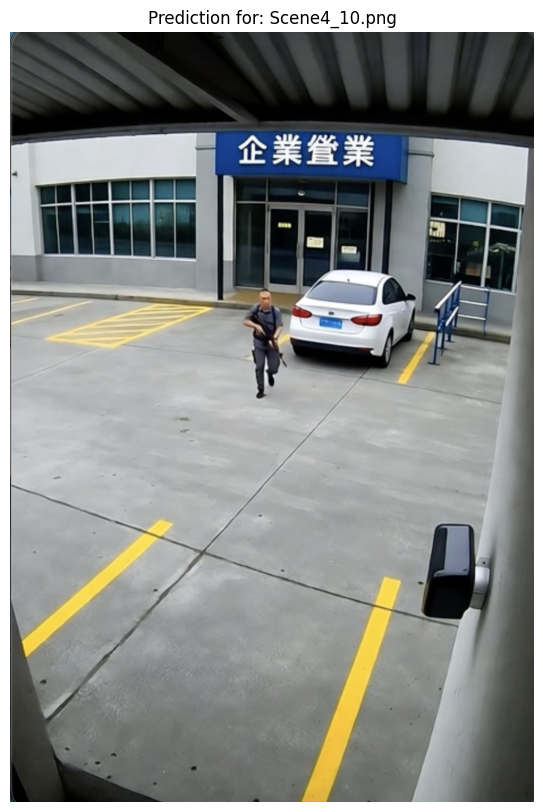


Predicting on sample image 3: Scene4_19.png

image 1/1 /root/.cache/kagglehub/datasets/simuletic/cctv-weapon-dataset/versions/4/Dataset/images/Scene4_19.png: 640x448 (no detections), 244.4ms
Speed: 3.9ms preprocess, 244.4ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 448)
Results saved to /content/runs/detect/predict


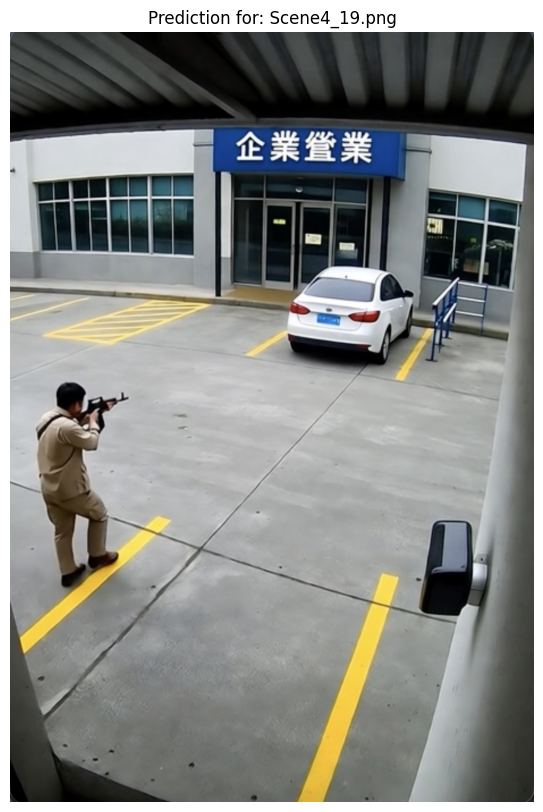


Predicting on sample image 4: Scene3_11.png

image 1/1 /root/.cache/kagglehub/datasets/simuletic/cctv-weapon-dataset/versions/4/Dataset/images/Scene3_11.png: 640x448 (no detections), 269.0ms
Speed: 4.3ms preprocess, 269.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 448)
Results saved to /content/runs/detect/predict


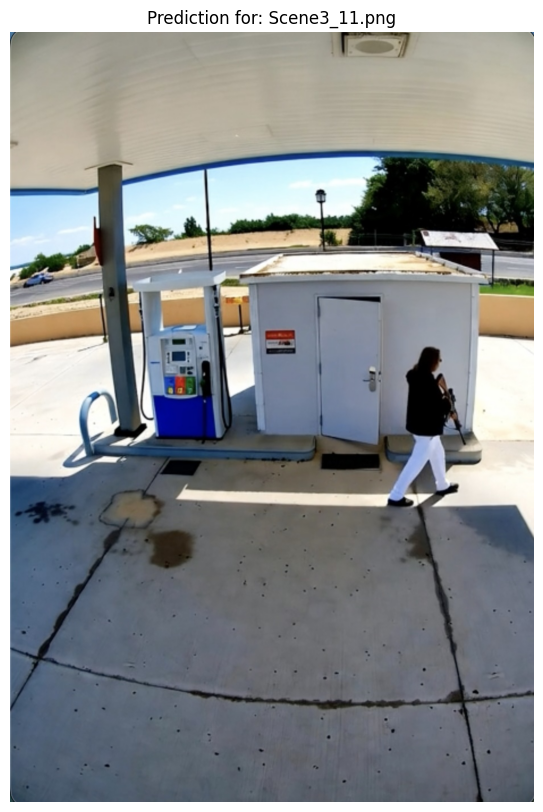


Predicting on sample image 5: Scene3_23.png

image 1/1 /root/.cache/kagglehub/datasets/simuletic/cctv-weapon-dataset/versions/4/Dataset/images/Scene3_23.png: 640x448 (no detections), 306.7ms
Speed: 4.0ms preprocess, 306.7ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 448)
Results saved to /content/runs/detect/predict


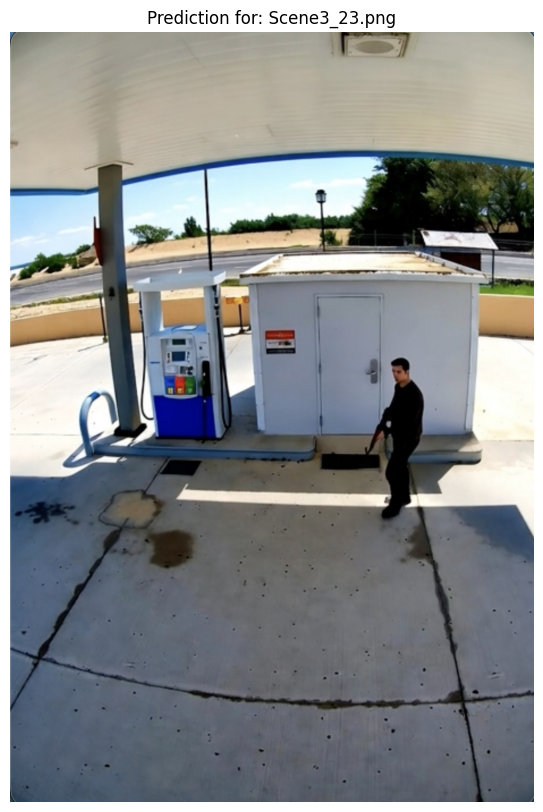

In [ ]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2
import os
from pathlib import Path

# Load the trained model
model = YOLO('/yolov8_trained.pt')

# Ensure sample_image_paths is available from the earlier cell
if 'sample_image_paths' in locals() and len(sample_image_paths) > 0:
    print(f"Using {len(sample_image_paths)} sample images for prediction.")

    for i, img_path_str in enumerate(sample_image_paths):
        sample_predict_image_path = Path(img_path_str)
        print(f"\nPredicting on sample image {i+1}: {sample_predict_image_path.name}")

        # Run inference on the sample image
        results = model.predict(
            source=str(sample_predict_image_path),
            imgsz=640,
            conf=0.25, # Confidence threshold
            iou=0.7,   # IoU threshold
            show=False, # Don't show the image automatically
            save=True, # Save the predicted image to disk
            exist_ok=True # Overwrite existing results for each run
        )

        if results and len(results) > 0:
            output_dir = results[0].save_dir

            # Ultralytics often saves output images as .jpg, even if input was .png
            predicted_image_name = sample_predict_image_path.stem + '.jpg'
            predicted_image_path = Path(output_dir) / predicted_image_name

            if predicted_image_path.exists():
                img = cv2.imread(str(predicted_image_path))
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

                plt.figure(figsize=(10, 10))
                plt.imshow(img)
                plt.title(f"Prediction for: {sample_predict_image_path.name}")
                plt.axis('off')
                plt.show()
            else:
                print(f"Could not find predicted image at {predicted_image_path}. \nContents of output directory {output_dir}:")
                !ls -l {output_dir}
        else:
            print(f"No prediction results were returned for {sample_predict_image_path.name}.")
else:
    print("Skipping prediction as 'sample_image_paths' list is not available or empty.")
    print("Please ensure the cell that generates sample_image_paths (e.g., cell 3432a10b) was run.")

##Testing with Real World dataset (cctv image or postage)

Attempting to predict on: /images (5).jpeg
Predicting on: images (5).jpeg

image 1/1 /images (5).jpeg: 512x640 6 persons, 4 weapons, 484.8ms
Speed: 3.9ms preprocess, 484.8ms inference, 2.6ms postprocess per image at shape (1, 3, 512, 640)
Results saved to /content/runs/detect/predict


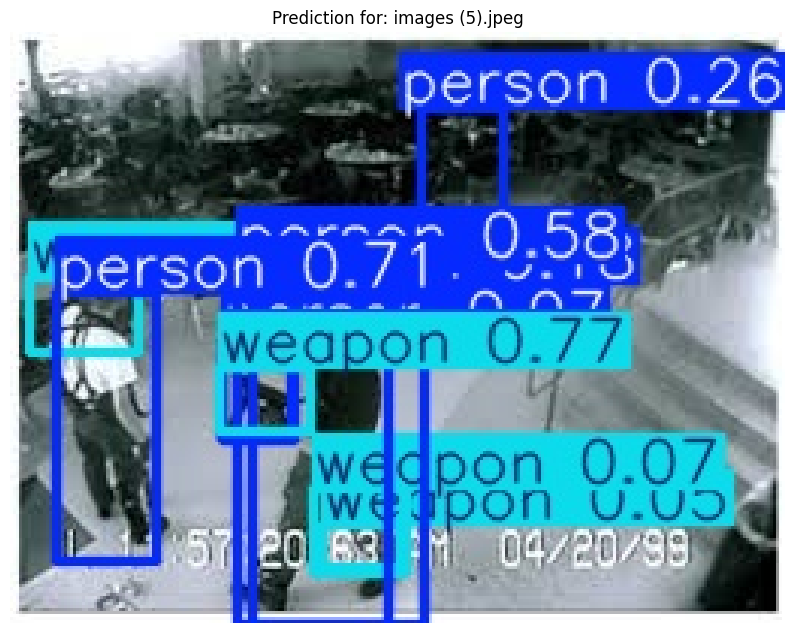

In [ ]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2
import os
from pathlib import Path

# Load the trained model
model = YOLO('/yolov8_trained.pt')

# --- Specify the image you want to predict on ---
# Using the image path explicitly provided by the user.
image_to_predict_path = "/images (5).jpeg"
print(f"Attempting to predict on: {image_to_predict_path}")

# Ensure the image path exists before proceeding
if not Path(image_to_predict_path).exists():
    print(f"Error: The specified image path does not exist: {image_to_predict_path}")
else:
    print(f"Predicting on: {Path(image_to_predict_path).name}")

    # Run inference on the selected image
    results = model.predict(
        source=str(image_to_predict_path),
        imgsz=640,
        conf=0.05,   # Lowered Confidence threshold
        iou=0.7,    # IoU threshold
        show=False, # Don't show the image automatically
        save=True,  # Save the predicted image to disk
        exist_ok=True # Overwrite existing results for each run
    )

    if results and len(results) > 0:
        output_dir = results[0].save_dir
        # Ultralytics often saves output images as .jpg, even if input was another format.
        predicted_image_name = Path(image_to_predict_path).stem + '.jpg'
        predicted_image_path = Path(output_dir) / predicted_image_name

        if predicted_image_path.exists():
            img = cv2.imread(str(predicted_image_path))
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            plt.figure(figsize=(10, 10))
            plt.imshow(img)
            plt.title(f"Prediction for: {Path(image_to_predict_path).name}")
            plt.axis('off')
            plt.show()
        else:
            print(f"Could not find predicted image at {predicted_image_path}. \nContents of output directory {output_dir}:")
            !ls -l {output_dir}
    else:
        print(f"No prediction results were returned for {Path(image_to_predict_path).name}.")

In [ ]:
image_paths_for_prediction = [
    "/images (5).jpeg",
    "/7402907f-a4e2-4696-8cec-62c839432966-large1x1_MarionGunmanCaughtPackage.movframe856.png",
    "/dangerous-masked-criminals-weapon-stealing-money-house-view-cctv-camera-dangerous-masked-criminals-weapon-180022531.jpg",
    "/images (6).jpeg",
    "/download (6).jpeg",
    "/download (5).jpeg"
]

# Example: If your images are in the current directory, you can list them like this:
# import os
# image_paths_for_prediction = [f for f in os.listdir('.') if f.lower().endswith(('.png', '.jpg', '.jpeg'))][:5]

if not image_paths_for_prediction:
    print("Please update 'image_paths_for_prediction' with the paths to your 5 images.")
else:
    print(f"Using {len(image_paths_for_prediction)} images for prediction:")
    for p in image_paths_for_prediction:
        print(f"- {p}")

Using 6 images for prediction:
- /images (5).jpeg
- /7402907f-a4e2-4696-8cec-62c839432966-large1x1_MarionGunmanCaughtPackage.movframe856.png
- /dangerous-masked-criminals-weapon-stealing-money-house-view-cctv-camera-dangerous-masked-criminals-weapon-180022531.jpg
- /images (6).jpeg
- /download (6).jpeg
- /download (5).jpeg


Using 6 images for prediction.

Predicting on image 2/6: 7402907f-a4e2-4696-8cec-62c839432966-large1x1_MarionGunmanCaughtPackage.movframe856.png

image 1/1 /7402907f-a4e2-4696-8cec-62c839432966-large1x1_MarionGunmanCaughtPackage.movframe856.png: 640x640 (no detections), 642.6ms
Speed: 7.1ms preprocess, 642.6ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /content/runs/detect/predict


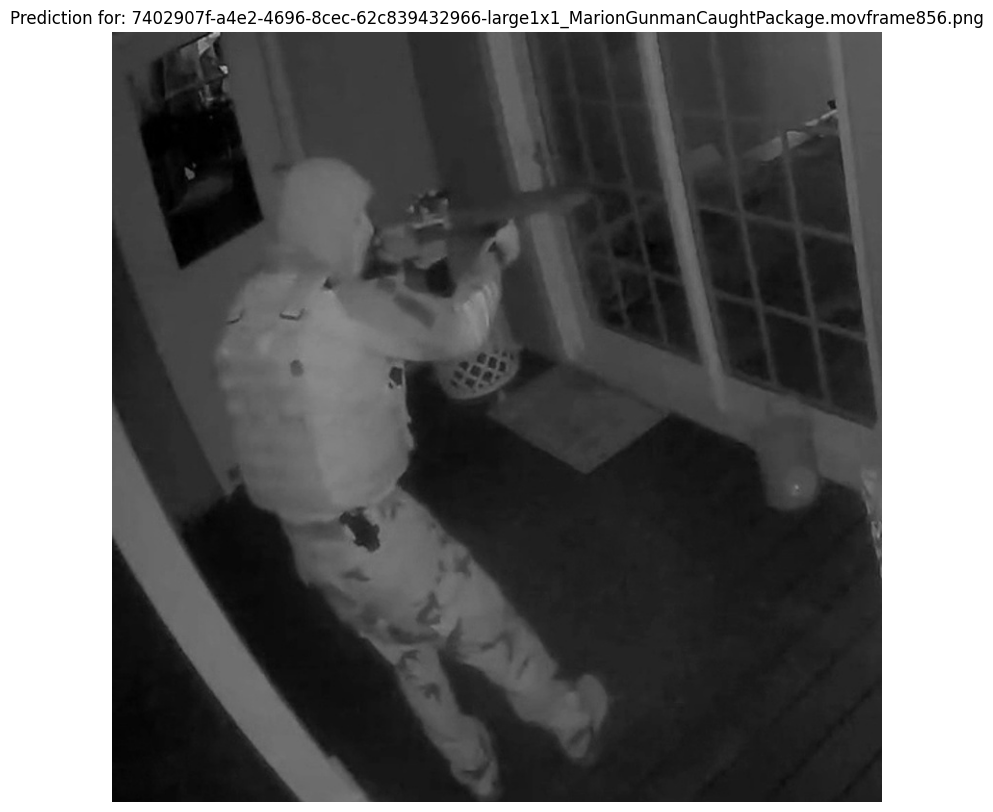


Predicting on image 3/6: dangerous-masked-criminals-weapon-stealing-money-house-view-cctv-camera-dangerous-masked-criminals-weapon-180022531.jpg

image 1/1 /dangerous-masked-criminals-weapon-stealing-money-house-view-cctv-camera-dangerous-masked-criminals-weapon-180022531.jpg: 448x640 (no detections), 434.8ms
Speed: 4.3ms preprocess, 434.8ms inference, 0.6ms postprocess per image at shape (1, 3, 448, 640)
Results saved to /content/runs/detect/predict


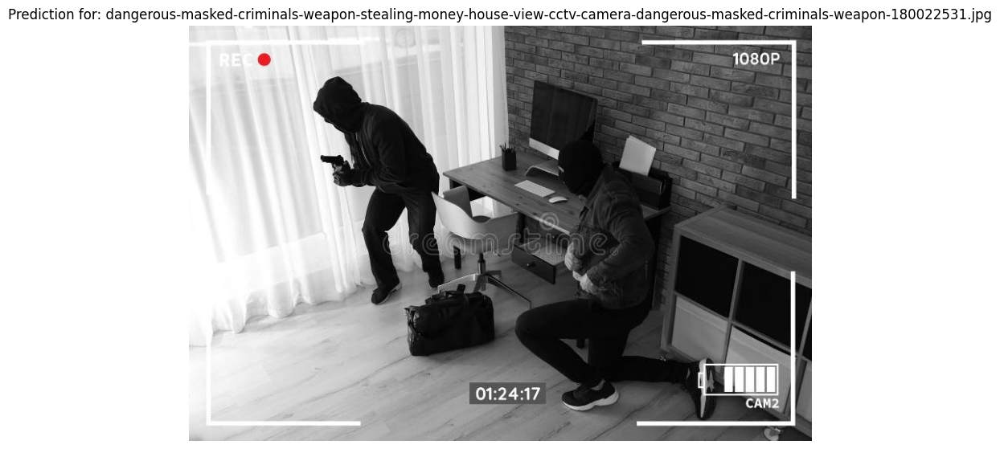


Predicting on image 4/6: images (6).jpeg

image 1/1 /images (6).jpeg: 384x640 (no detections), 377.0ms
Speed: 3.7ms preprocess, 377.0ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)
Results saved to /content/runs/detect/predict


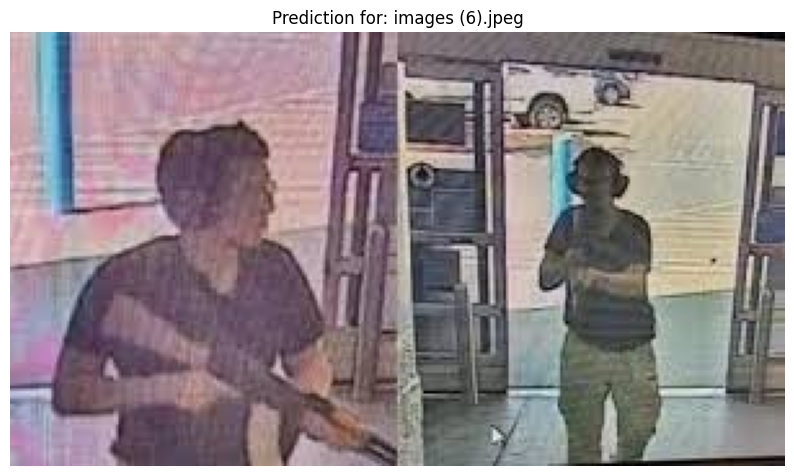


Predicting on image 5/6: download (6).jpeg

image 1/1 /download (6).jpeg: 384x640 (no detections), 374.9ms
Speed: 5.0ms preprocess, 374.9ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)
Results saved to /content/runs/detect/predict


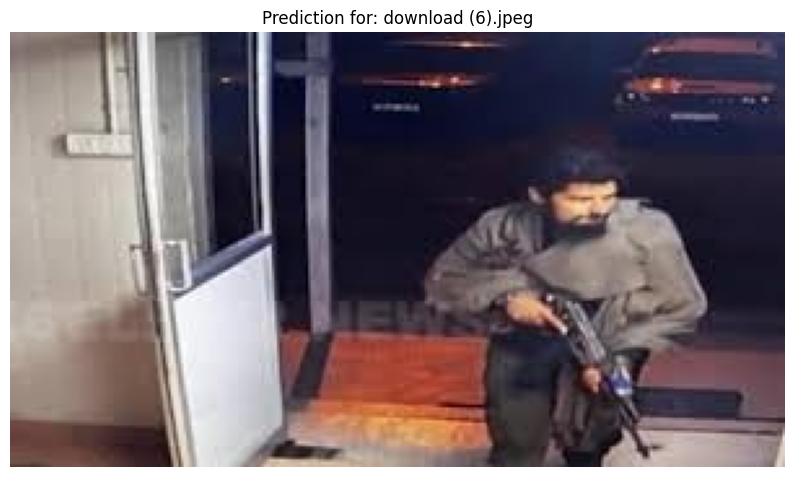


Predicting on image 6/6: download (5).jpeg

image 1/1 /download (5).jpeg: 384x640 (no detections), 385.4ms
Speed: 2.9ms preprocess, 385.4ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)
Results saved to /content/runs/detect/predict


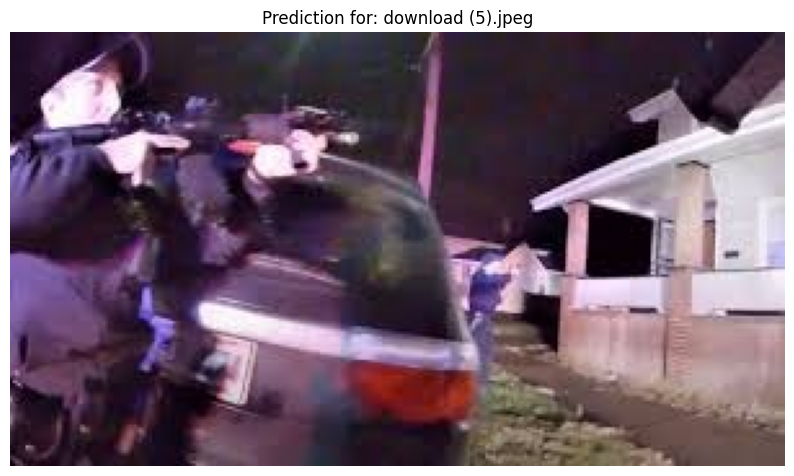

In [ ]:
# Ensure you Install ultralytics


from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2
import os
from pathlib import Path

# Load the trained model
# Assuming the model is saved as 'yolov8_trained.pt' in the root directory
model = YOLO('/yolov8_trained.pt')

if 'image_paths_for_prediction' in locals() and len(image_paths_for_prediction) > 0:
    print(f"Using {len(image_paths_for_prediction)} images for prediction.")

    for i, img_path_str in enumerate(image_paths_for_prediction):
        img_path = Path(img_path_str)

        if not img_path.exists():
            print(f"Warning: Image file not found at {img_path_str}. Skipping this image.")
            continue

        print(f"\nPredicting on image {i+1}/{len(image_paths_for_prediction)}: {img_path.name}")

        # Run inference on the current image
        results = model.predict(
            source=str(img_path),
            imgsz=640,
            conf=0., # Confidence threshold (adjust as needed)
            iou=0.7,   # IoU threshold (adjust as needed)
            show=False, # Don't show the image automatically
            save=True, # Save the predicted image to disk
            exist_ok=True # Overwrite existing results for each run
        )

        if results and len(results) > 0:
            output_dir = results[0].save_dir

            # Ultralytics often saves output images as .jpg, even if input was .png
            predicted_image_name = img_path.stem + '.jpg'
            predicted_image_path = Path(output_dir) / predicted_image_name

            if predicted_image_path.exists():
                img = cv2.imread(str(predicted_image_path))
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

                plt.figure(figsize=(10, 10))
                plt.imshow(img)
                plt.title(f"Prediction for: {img_path.name}")
                plt.axis('off')
                plt.show()
            else:
                print(f"Could not find predicted image at {predicted_image_path}. \nContents of output directory {output_dir}:")
                !ls -l {output_dir}
        else:
            print(f"No prediction results were returned for {img_path.name}.")
else:
    print("Skipping prediction as 'image_paths_for_prediction' list is not available or empty.")
    print("Please ensure the cell that defines 'image_paths_for_prediction' was run correctly.")

### Training with YOLOv8m Model

Let's try training with `yolov8m.pt`, a medium-sized YOLOv8 model. This model has more parameters than `yolo11s.pt` and might be able to capture more complex features, potentially leading to better detection performance. We'll use similar training parameters but you can adjust them further if needed.

In [ ]:
import os
from ultralytics import YOLO

# Ensure ultralytics is installed in case of environment resets
!pip install ultralytics --force-reinstall

# Load a pre-trained YOLOv8 medium model
# This model often offers a good balance between speed and accuracy
model_m = YOLO('yolov8m.pt')

# Train the model with your dataset and specified hyperparameters
# You can adjust epochs, batch size, learning rates, etc. for further optimization.
model_m.train(
        data="/kaggle/working/dataset.yaml", # Ensure your dataset.yaml path is correct
        epochs=150, # Increased epochs to allow more training time
        imgsz=640,
        batch=16,   # Adjusted batch size (can be experimented with)
        optimizer='auto',
        lr0=0.01,   # Initial learning rate
        lrf=0.001,  # Final learning rate (can be experimented with)
        weight_decay=5e-4, # Adjusted weight decay
        warmup_epochs=5,
        patience=75, # Increased patience to allow more epochs before early stopping
        exist_ok=True,
        augment=True, # Keep augmentation enabled
        workers=8,
        device=0,
        verbose=True, # Set to True to see more detailed training output
        momentum=0.937, # Adjusted momentum
        cos_lr=True, # Use cosine learning rate scheduler

        box=7.5,
        cls=0.5,
        dfl=1.5,

        hsv_h=0.015,
        hsv_s=0.7,
        hsv_v=0.7,
        degrees=0.0,
        translate=0.1,
        scale=0.5,
        shear=0.0,
        perspective=0.0,
        flipud=0.0,
        fliplr=0.5,
        mosaic=1.0,
        mixup=0.1,
        copy_paste=0.0
        )

print("Training with YOLOv8m complete. Best model saved.")

# Save the trained model with a new name to differentiate it
model_m.save('yolov8m_trained.pt')
print("YOLOv8m model trained and saved successfully as yolov8m_trained.pt!")

Ultralytics 8.3.232 🚀 Python-3.12.12 torch-2.9.0+cu126 CPU (Intel Xeon CPU @ 2.00GHz)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=dataset.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=25, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.7, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.001, mask_ratio=4, max_det=300, mixup=0.1, mode=train, model=yolov8m.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=75, perspective=0.0, plots=True, pose=12.0, pretrained=Tr